# Prepare Dataset

In [885]:
# Load package
import os
import time
import re
from glob import glob
import shutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import torchvision
import torch
from sklearn.linear_model import LogisticRegression
import sklearn 

import torchvision.transforms 
import torch 

import tensorflow as tf
from PIL import Image
import plotly.express as px

print("Tensorflow: v{}".format(tf.__version__))
%matplotlib inline

Tensorflow: v2.8.0


In [214]:
BASE_DIR = r'C:\Users\Selen\Desktop\tum-ai\data\images_sample'
PATH = r'data'
CSV_FILE_PATH = r'data/Dataset_Chest_X_Ray_Sample.csv'

In [203]:
# Load image dataset labels
df = pd.read_csv(CSV_FILE, sep=';')
display(df)

,Image_Index,Finding_Labels,Follow_up,Patient_ID,Patient_Age,Patient_Gender,View_Position,Original_Image_Width,Original_Image_Height,OriginalImagePixelSpacing_x,OriginalImagePixelSpacing_y
0,00000005_000.png,No Finding,0,5,69,F,PA,2048,2500,"0,168","0,168"
1,00000005_001.png,No Finding,1,5,69,F,AP,2500,2048,"0,168","0,168"
2,00000005_003.png,No Finding,3,5,69,F,PA,2992,2991,"0,143","0,143"
3,00000009_000.png,Emphysema,0,9,72,M,PA,2992,2991,"0,143","0,143"
4,00000011_001.png,No Finding,1,11,74,M,PA,2500,2048,"0,168","0,168"
...,...,...,...,...,...,...,...,...,...,...,...
10011,00030780_000.png,Atelectasis,0,30780,66,M,PA,2021,2021,"0,194311","0,194311"
10012,00030782_000.png,No Finding,0,30782,40,M,AP,3056,2544,"0,139","0,139"
10013,00030787_000.png,No Finding,0,30787,33,M,PA,2021,2021,"0,194311","0,194311"
10014,00030791_000.png,No Finding,0,30791,49,M,PA,2021,2021,"0,194311","0,194311"


In [193]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10016 entries, 0 to 10015
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   Image_Index                  10016 non-null  object
 1   Finding_Labels               10016 non-null  object
 2   Follow_up                    10016 non-null  int64 
 3   Patient_ID                   10016 non-null  int64 
 4   Patient_Age                  10016 non-null  int64 
 5   Patient_Gender               10016 non-null  object
 6   View_Position                10016 non-null  object
 7   Original_Image_Width         10016 non-null  int64 
 8   Original_Image_Height        10016 non-null  int64 
 9   OriginalImagePixelSpacing_x  10016 non-null  object
 10  OriginalImagePixelSpacing_y  10016 non-null  object
dtypes: int64(5), object(6)
memory usage: 860.9+ KB


In [194]:
df["Finding_Labels"].unique()

array(['No Finding', 'Emphysema', 'Pleural_Thickening', 'Cardiomegaly',
       'Infiltration', 'Pneumothorax', 'Atelectasis', 'Effusion',
       'Nodule', 'Fibrosis', 'Consolidation', 'Mass', 'Edema',
       'Pneumonia', 'Hernia'], dtype=object)

In [320]:
print("Total number of observations:", df.size)
df[['Finding_Labels']].value_counts(normalize=False)

Total number of observations: 110176


Finding_Labels    
No Finding            6621
Infiltration          1053
Atelectasis            510
Effusion               453
Nodule                 292
Pneumothorax           231
Mass                   207
Consolidation          141
Pleural_Thickening     119
Cardiomegaly           113
Emphysema               88
Fibrosis                87
Edema                   55
Pneumonia               36
Hernia                  10
dtype: int64

In [207]:
fig = px.histogram(df, x="Finding_Labels")
fig.show()

In [278]:
from sklearn.utils import class_weight
y_train = df['Finding_Labels'].values

class_weights = class_weight.compute_class_weight('balanced',
                                                 classes=np.unique(y_train),
                                                 y=y_train)
print(np.unique(y_train))
print(class_weights)

['Atelectasis' 'Cardiomegaly' 'Consolidation' 'Edema' 'Effusion'
 'Emphysema' 'Fibrosis' 'Hernia' 'Infiltration' 'Mass' 'No Finding'
 'Nodule' 'Pleural_Thickening' 'Pneumonia' 'Pneumothorax']
[ 1.30928105  5.90914454  4.7356974  12.14060606  1.47402502  7.58787879
  7.67509579 66.77333333  0.63412472  3.2257649   0.10085083  2.28675799
  5.61120448 18.54814815  2.89062049]


# Visualize the images

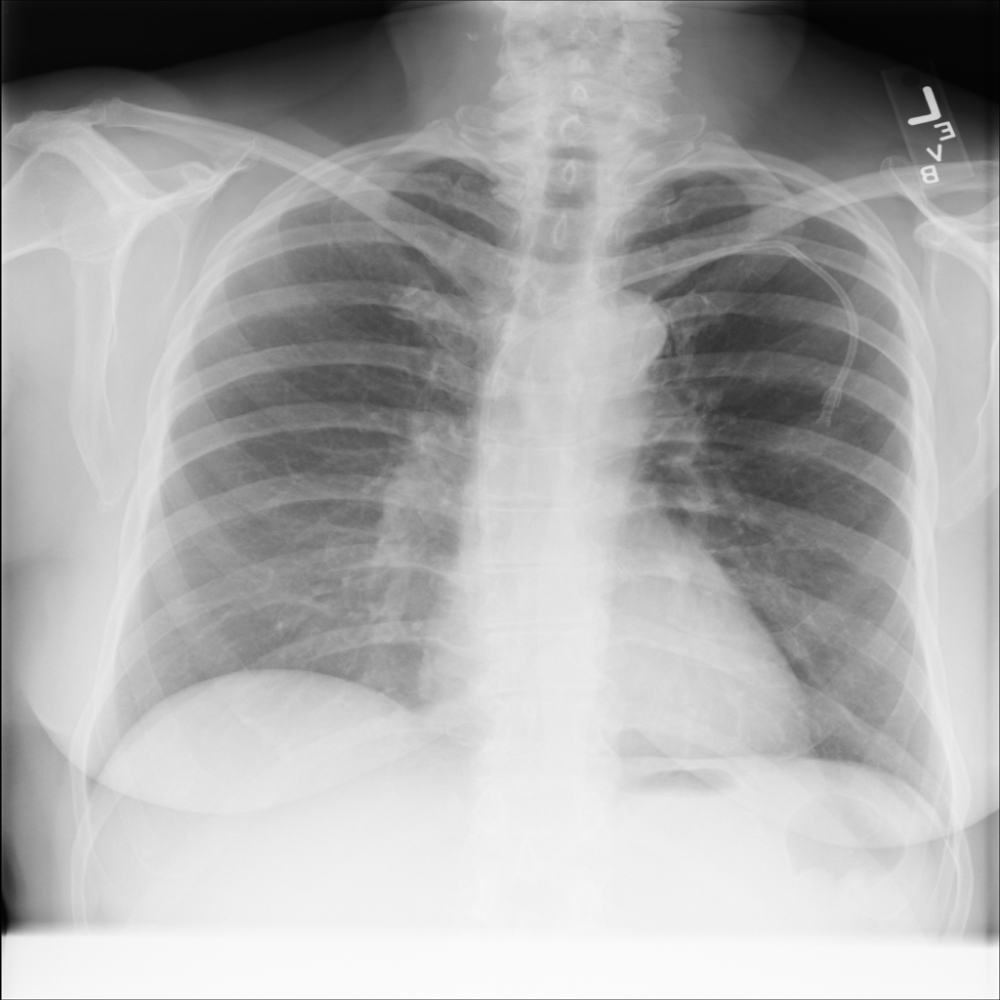

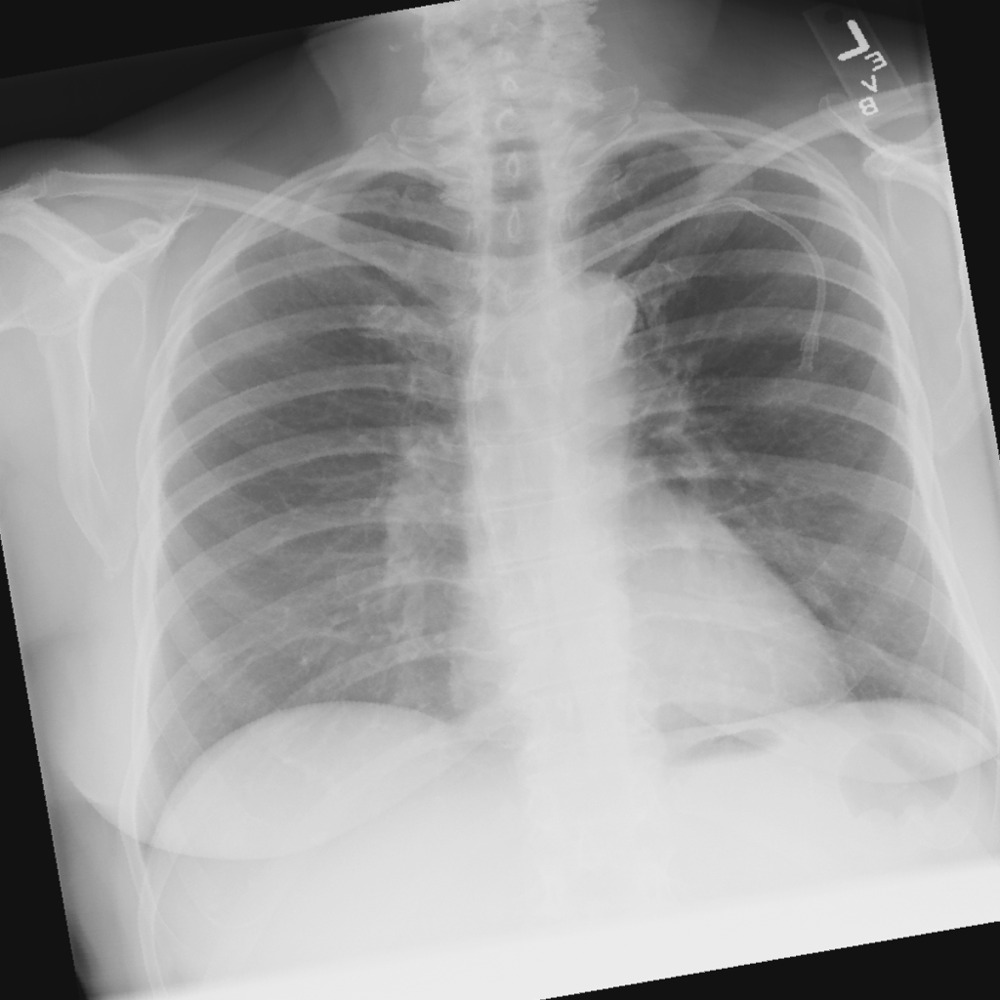

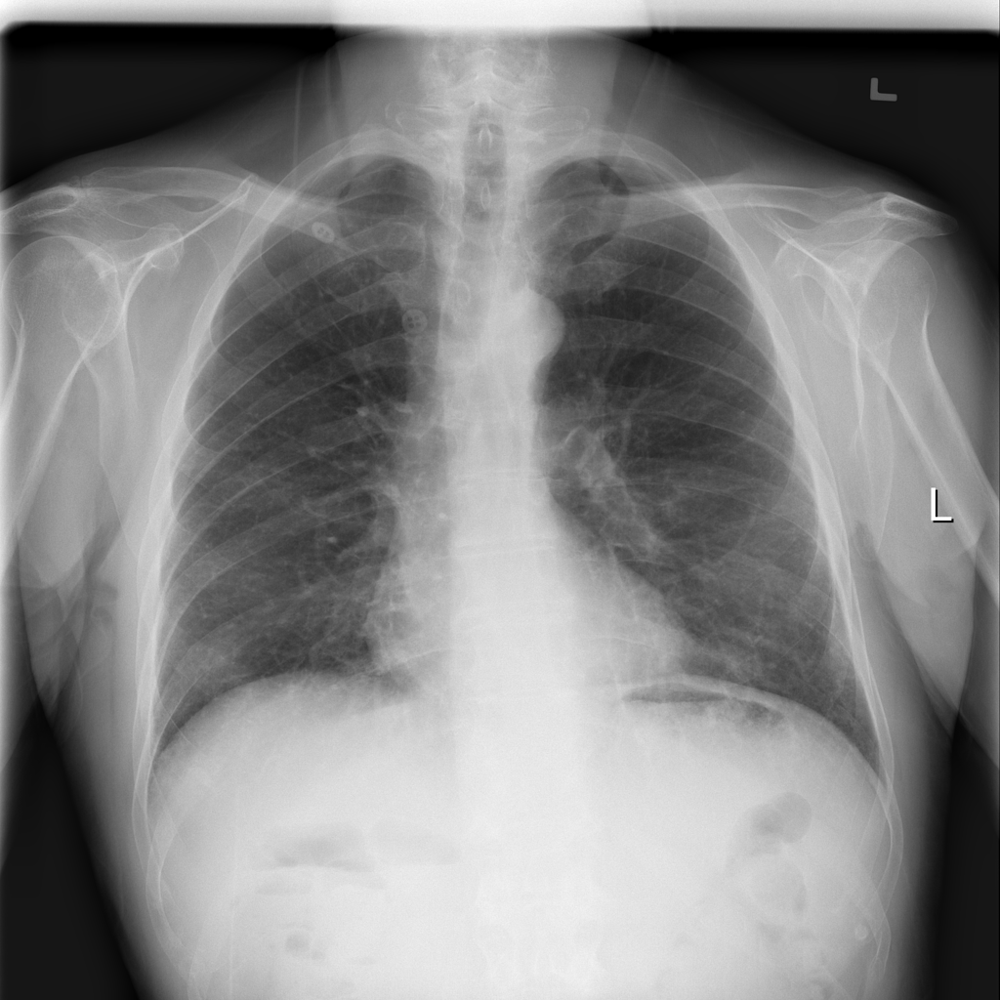

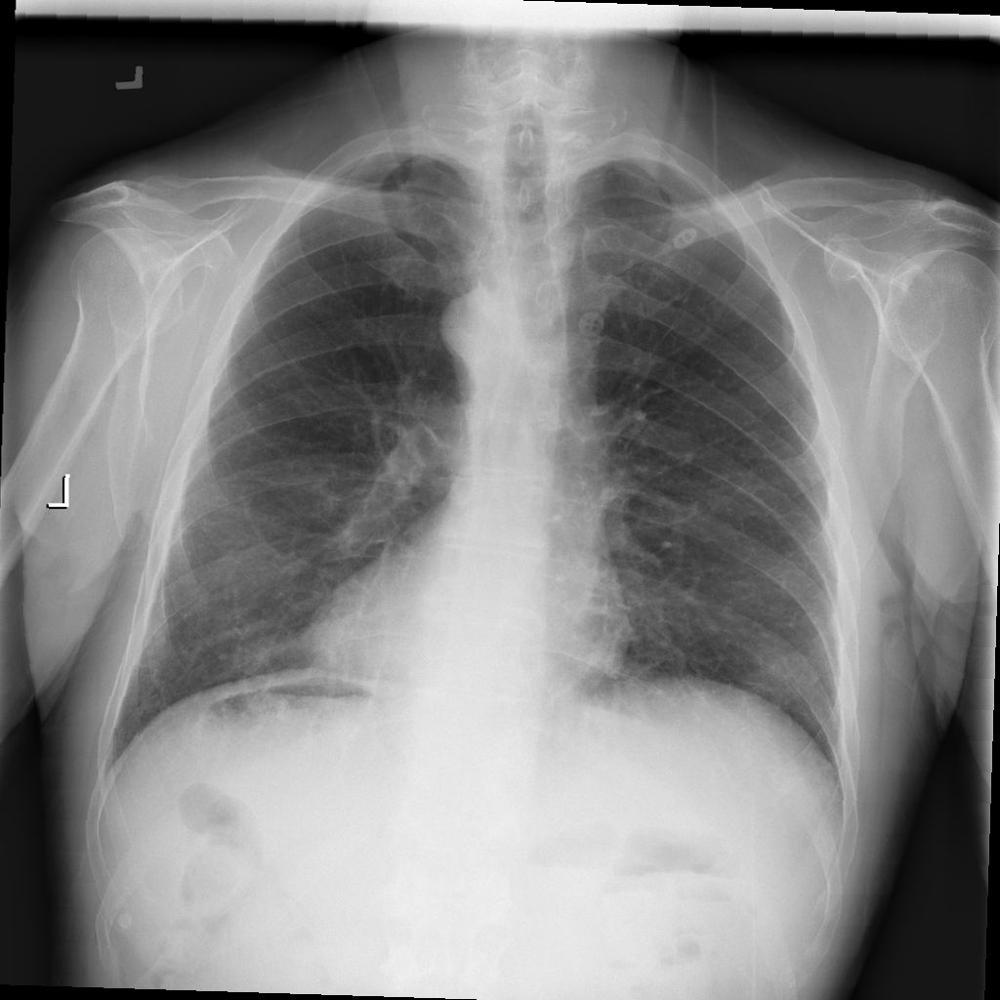

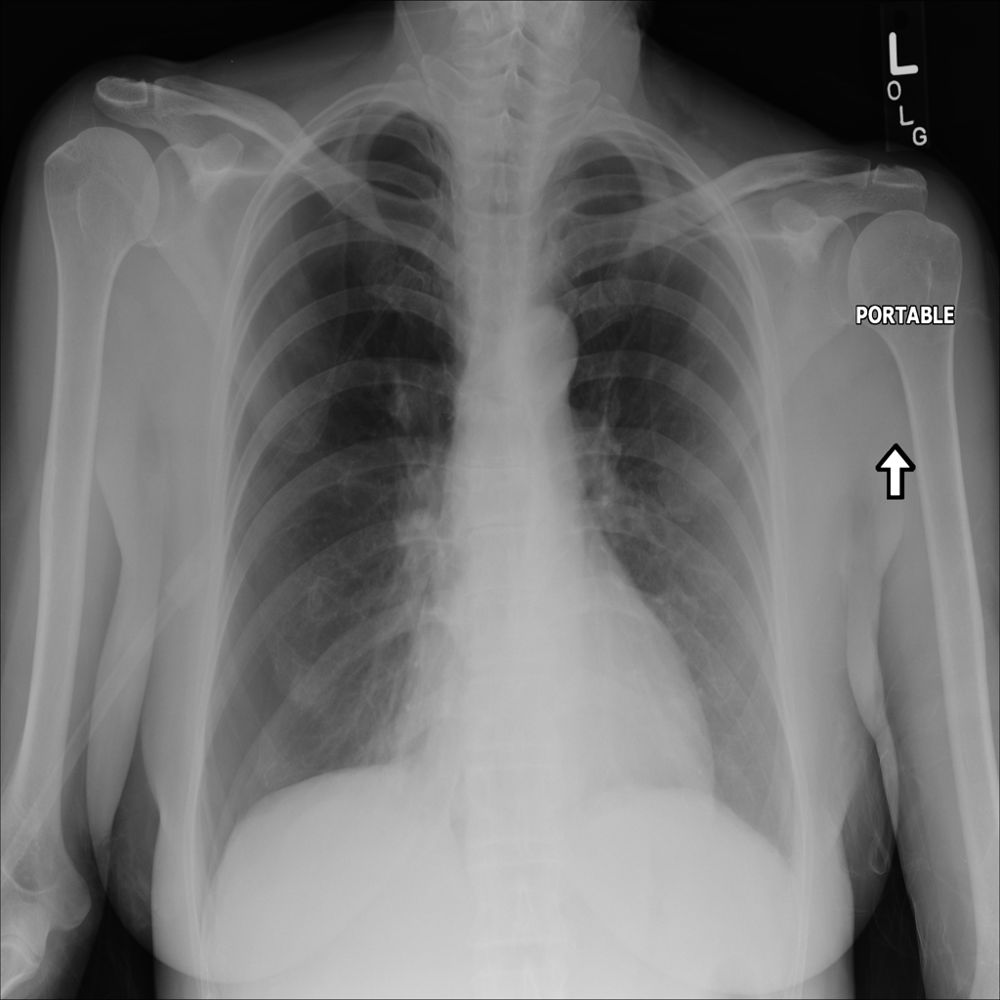

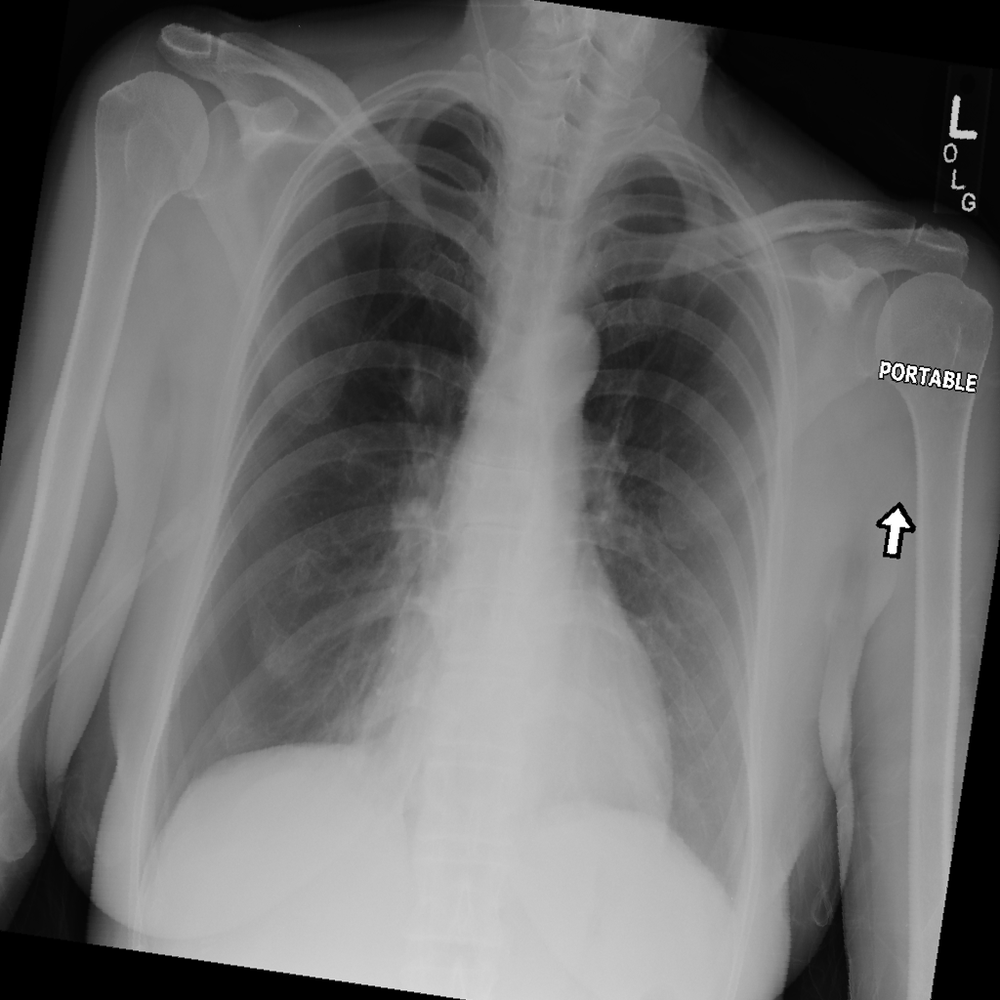

In [892]:
tr = transforms.Compose([
        transforms.RandomApply(transforms=[transforms.RandomHorizontalFlip(p=1)], p=0.5),
    transforms.RandomApply(transforms=[transforms.RandomAffine(degrees=10, shear=0)], p=0.3),
    transforms.RandomApply(transforms=[transforms.ColorJitter(brightness=(0.9,1),contrast=(0.3),saturation=(0.5,1),hue=(-0.1,0.1))], p=0.3),
    transforms.RandomApply(transforms=[transforms.RandomEqualize()], p=0.5),
    transforms.RandomApply(transforms=[transforms.RandomPerspective(distortion_scale=0.1, p=1)], p=0.1),
    transforms.RandomApply(transforms=[transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5))], p=0.1)
    ])

display(data[0][0])
display(tr(data[0][0]))
display(data[10][0])
display(tr(data[10][0]))
display(data[20][0])
display(tr(data[20][0]))

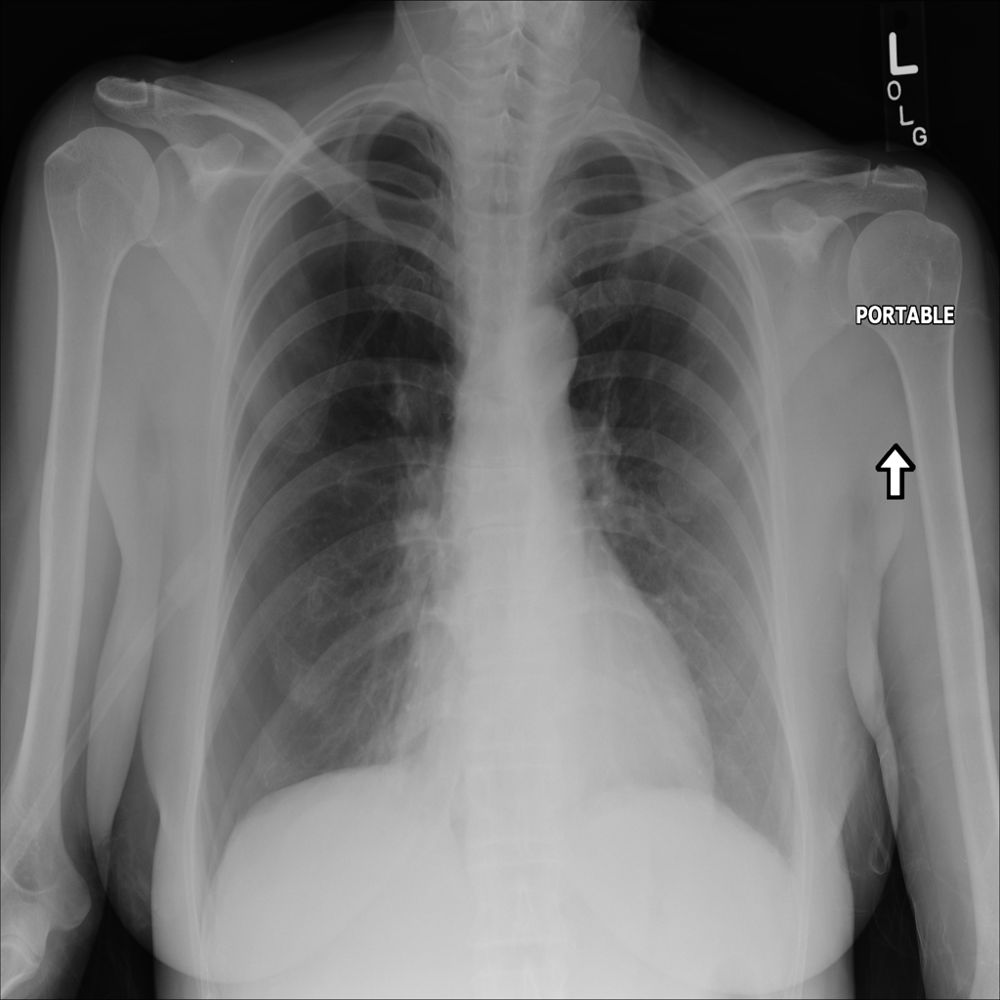

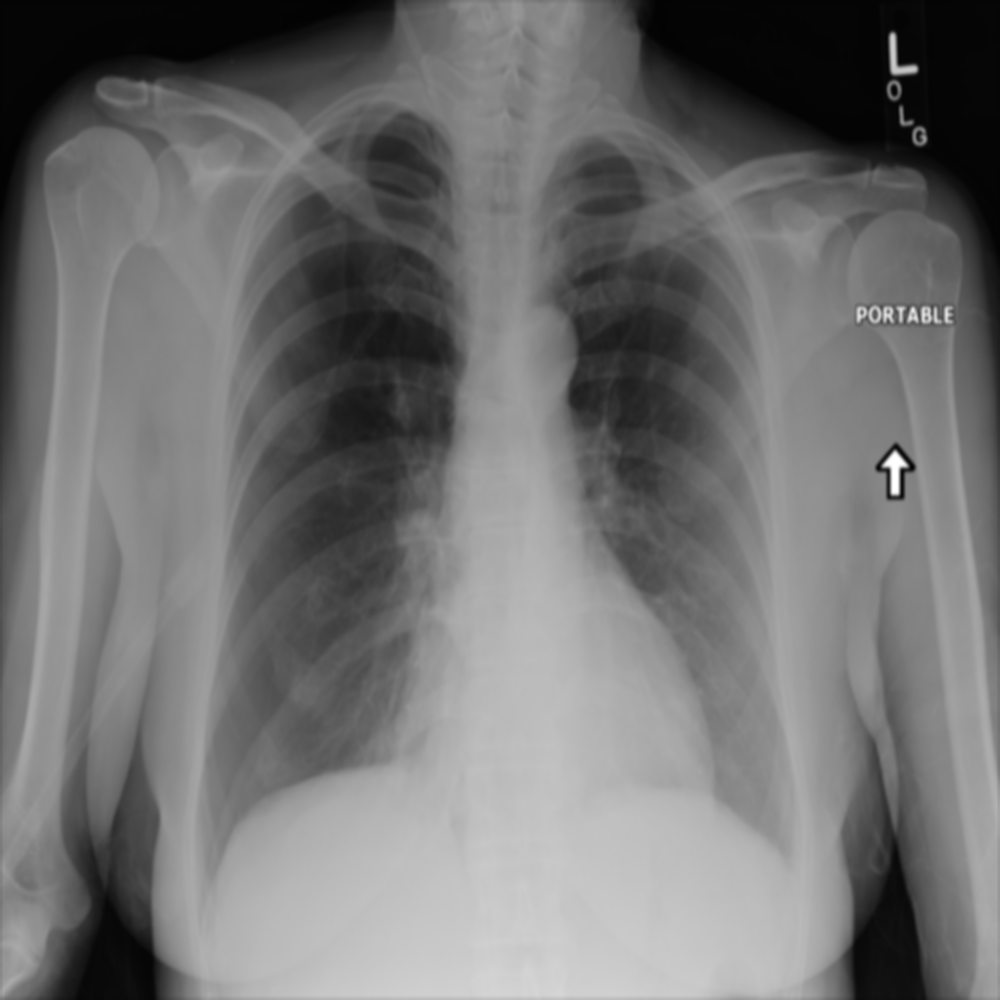

In [915]:
transs = transforms.Compose([
#     transforms.RandomApply(transforms=[transforms.RandomHorizontalFlip(p=1)], p=1),
#     transforms.RandomApply(transforms=[transforms.RandomAffine(degrees=10, shear=0)], p=1),
#     transforms.RandomApply(transforms=[transforms.ColorJitter(brightness=(0.9,1),contrast=(0.3),saturation=(0.5,1),hue=(-0.1,0.1))], p=1),
#     transforms.RandomApply(transforms=[transforms.RandomEqualize()], p=1),
#     transforms.RandomApply(transforms=[transforms.RandomPerspective(distortion_scale=0.2, p=1)], p=1),
    transforms.RandomApply(transforms=[transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5))], p=1)
    ])

# a = random.choice(tr)
# a=T.RandomPerspective(distortion_scale=0.1, p=1)
display(data[20][0])
display(transs(data[20][0]))

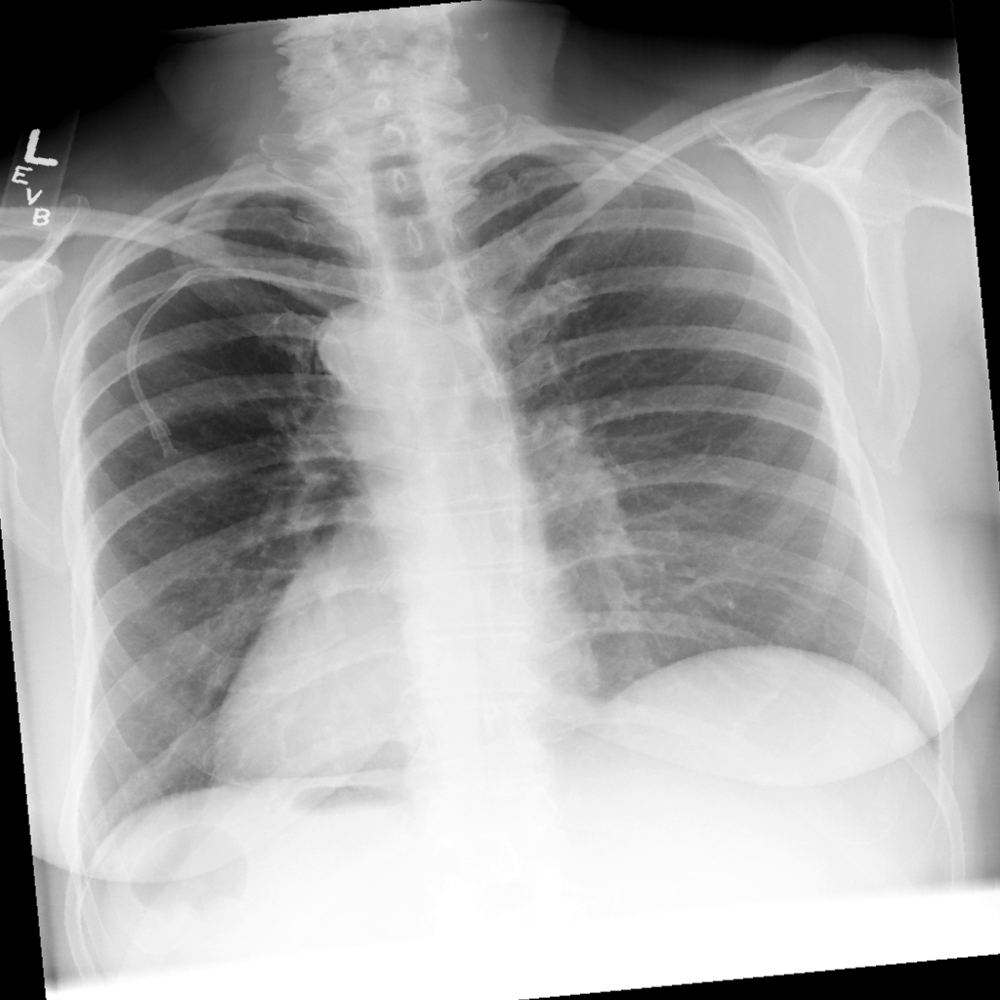

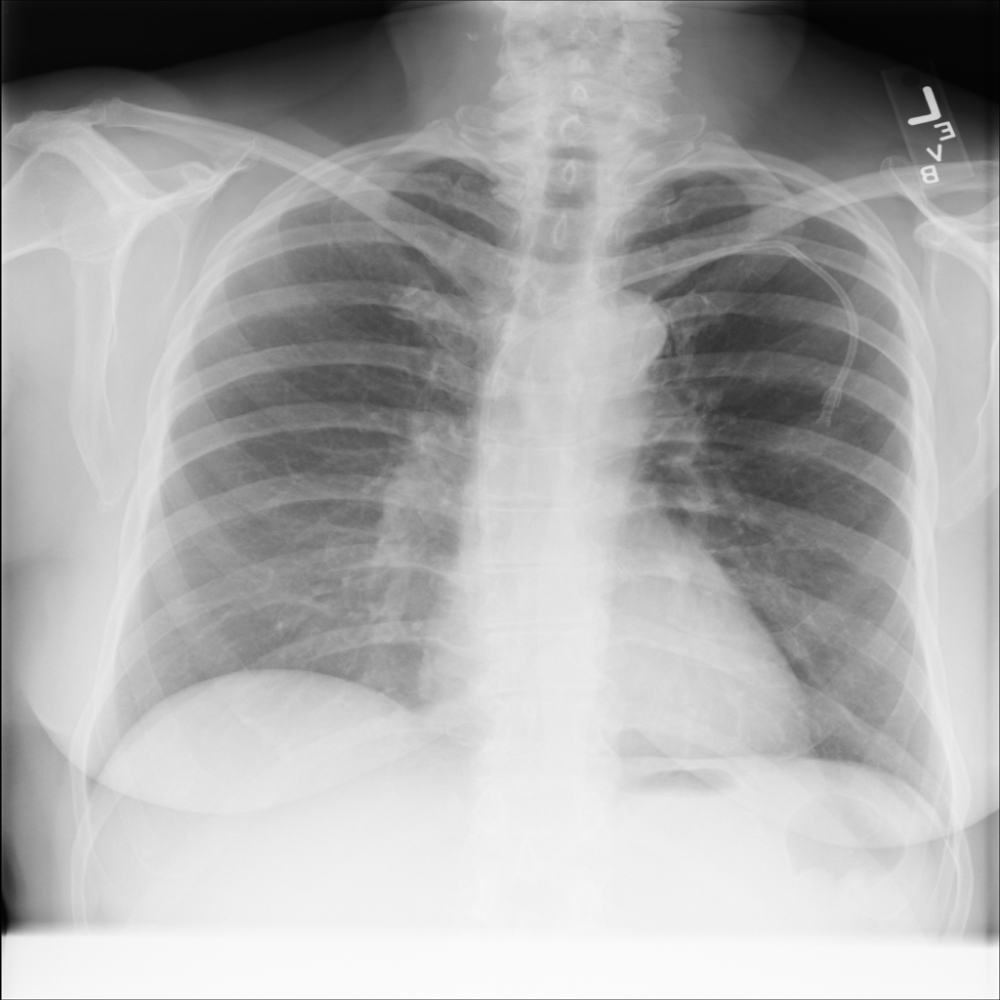

In [883]:
augmentation_rare = transforms.Compose([
    T.RandomHorizontalFlip(p=1),
    T.RandomAffine(degrees=10, shear=0),
    T.ColorJitter(brightness=(0.9,1),contrast=(0.3),saturation=(0.5,1),hue=(-0.1,0.1)),
    T.RandomEqualize(),
    T.RandomApply(transforms=[T.RandomPerspective(distortion_scale=0.1, p=1)], p=0.1),
#     T.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5))
    ])
display(augmentation_rare(data[0][0]))
display(data[0][0])

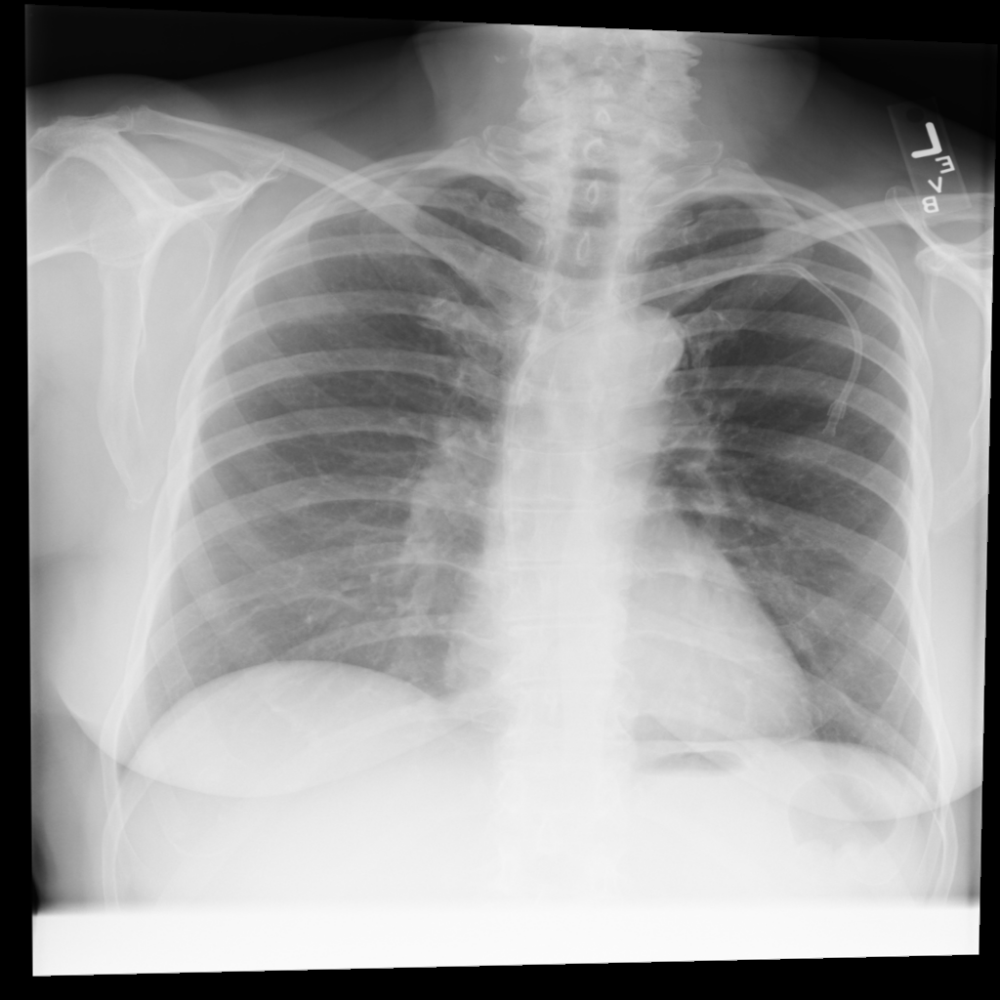

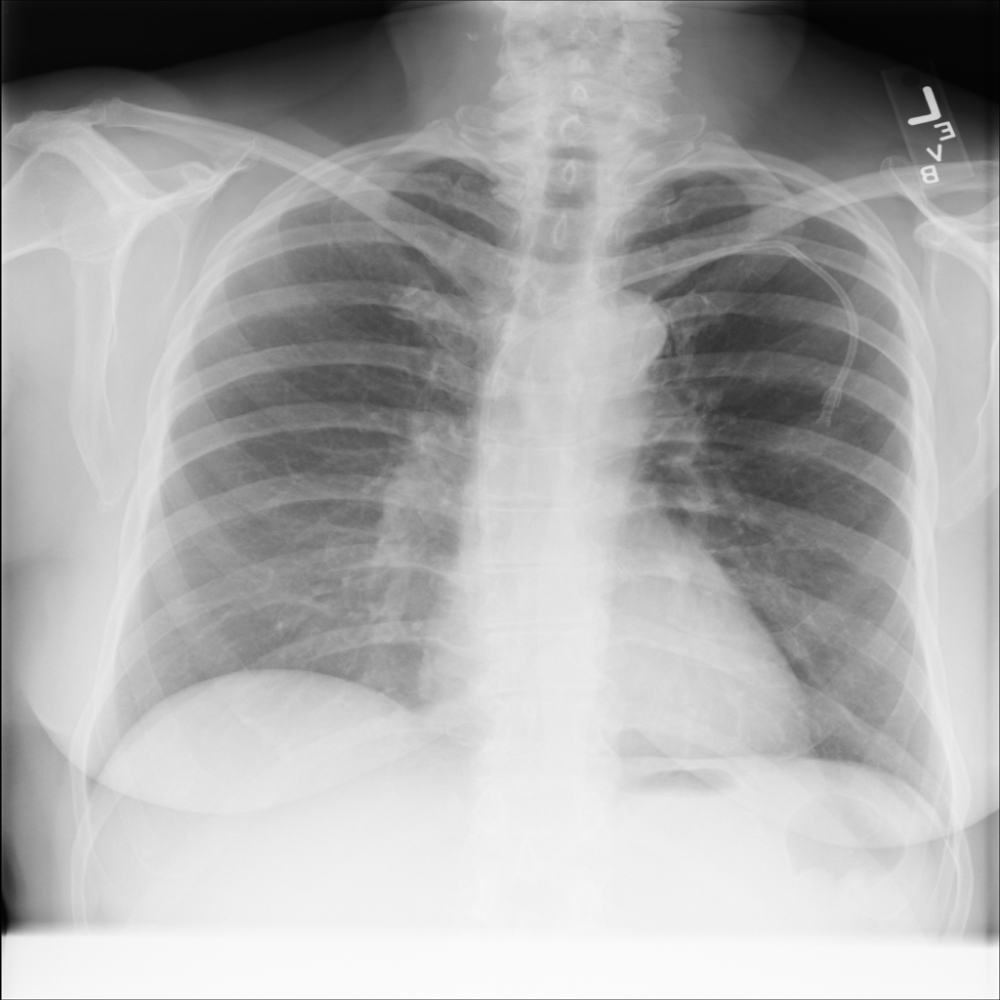

In [832]:
import random

tr = transforms.Compose([
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomAffine(degrees=10, scale=(.9, 1.1), shear=0),
        transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5),
        transforms.RandomEqualize(),
        transforms.RandomPerspective(distortion_scale=0.2, p=1),
        transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5))
    ])

# a = random.choice(tr)
a=T.RandomPerspective(distortion_scale=0.1, p=1)
display(a(data[0][0]))
display(data[0][0])

In [298]:
train_transforms = transforms.Compose([
        transforms.RandomHorizontalFlip(),
        transforms.RandomAffine(degrees=10, scale=(.9, 1.1), shear=0),
#         transforms.RandomPerspective(distortion_scale=0.2),
        transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5),
#         transforms.ToTensor(),
#         transforms.RandomErasing(scale=(0.02, 0.16), ratio=(0.3, 1.6)),
#         transforms.Normalize(mean=pre_trained_mean, std=pre_trained_std),
    ])

dataset = datasets.ImageFolder(PATH,train_transforms)
data = datasets.ImageFolder(PATH)

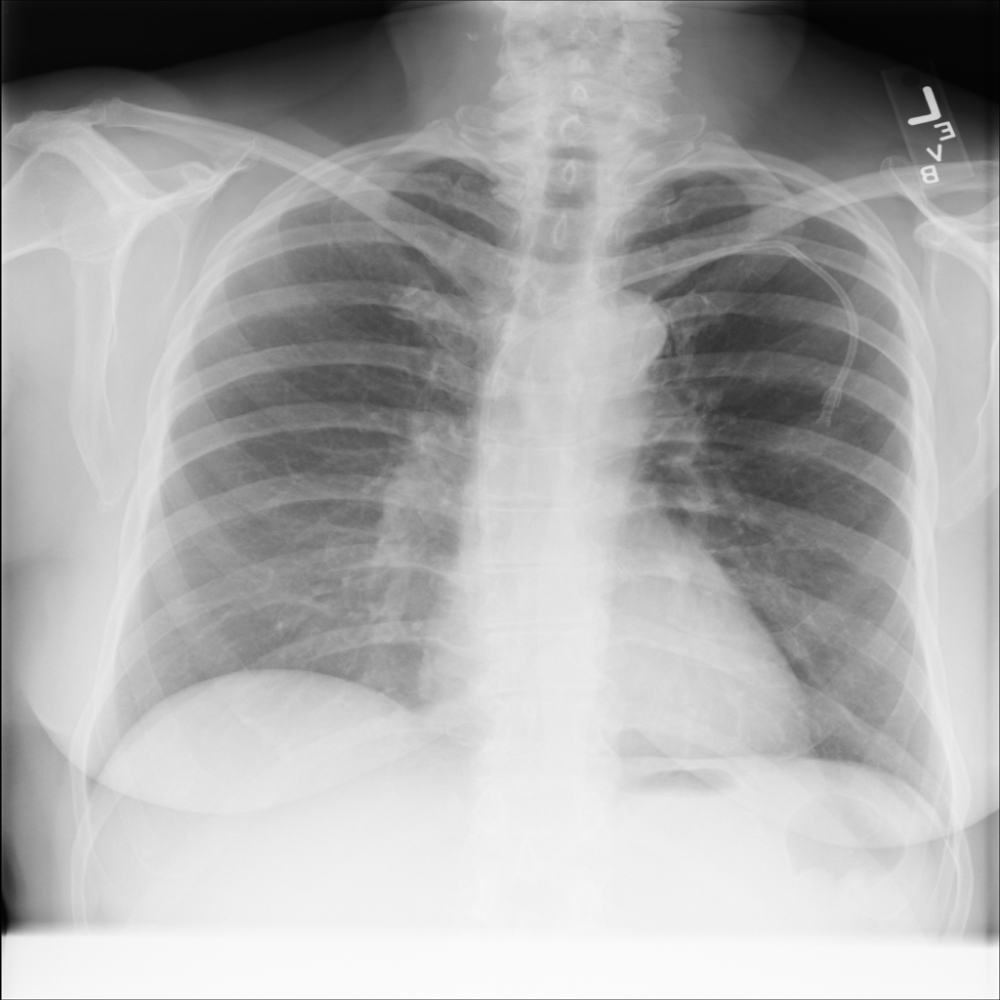

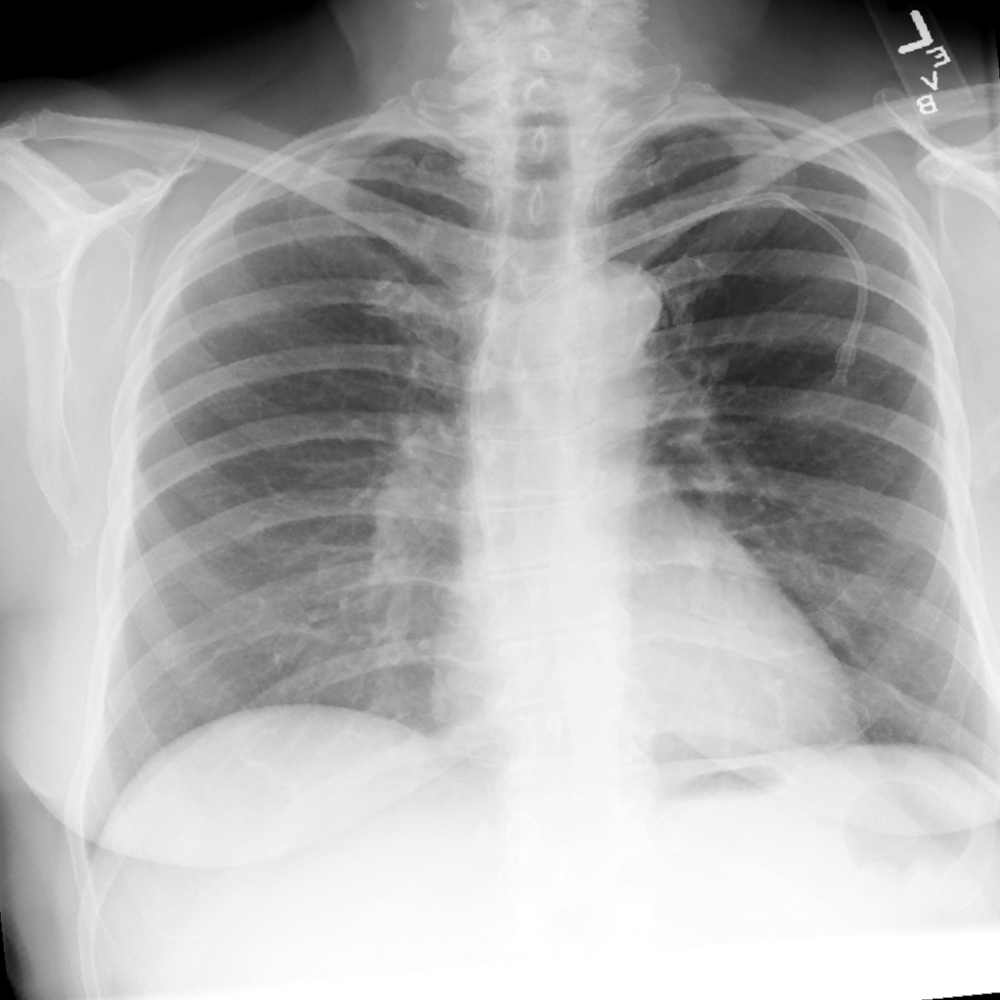

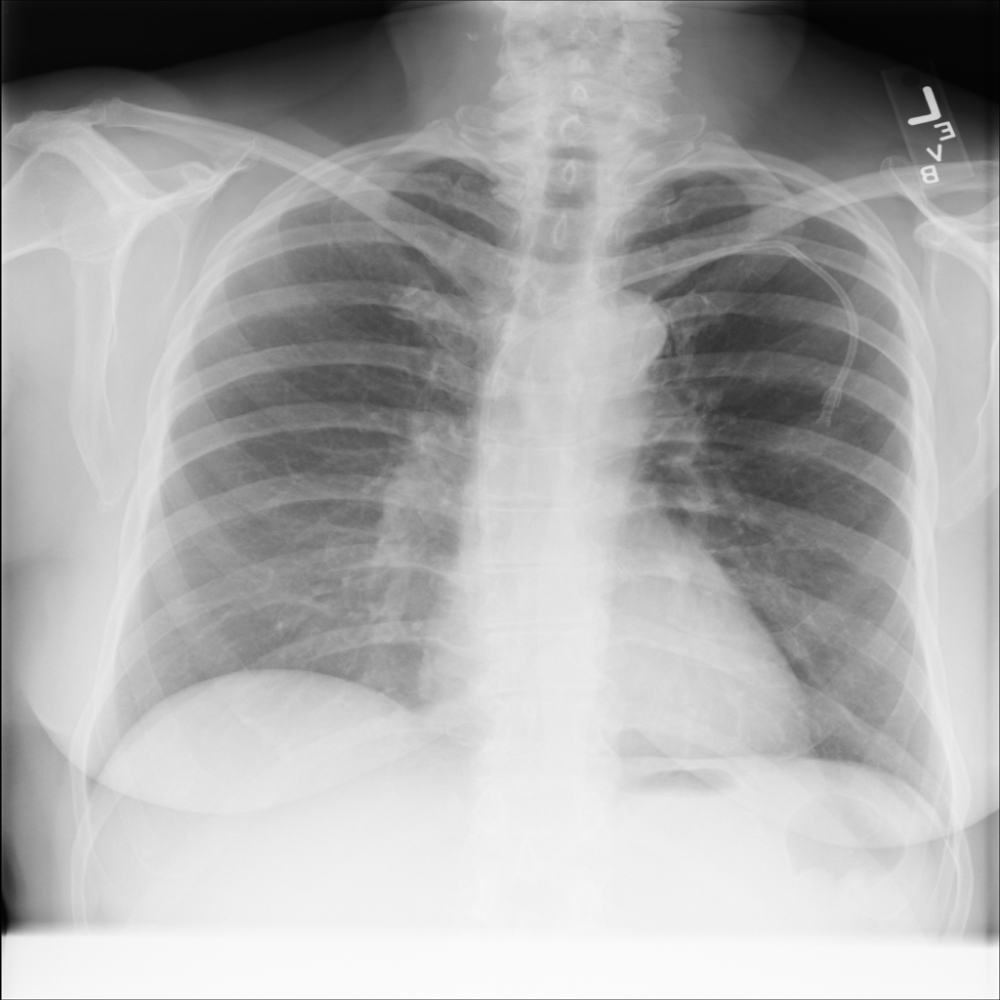

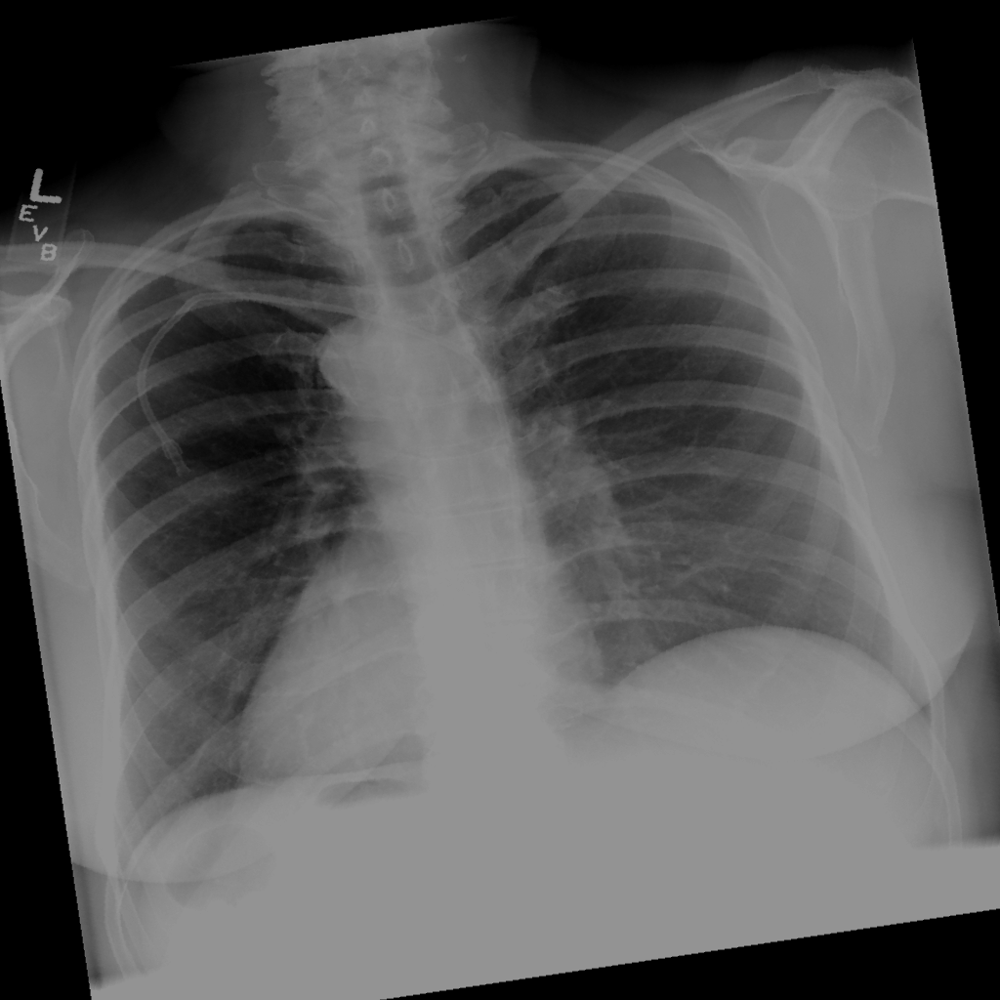

In [296]:
display(data[0][0])
display(dataset[0][0])

display(data[0][0])
display(dataset[0][0])

# Logistic Regression

In [198]:
df.dtypes

Image_Index                    object
Finding_Labels                 object
Follow_up                       int64
Patient_ID                      int64
Patient_Age                     int64
Patient_Gender                 object
View_Position                  object
Original_Image_Width            int64
Original_Image_Height           int64
OriginalImagePixelSpacing_x    object
OriginalImagePixelSpacing_y    object
dtype: object

In [199]:
df.columns
df['Patient_Gender_fact'], _ = pd.factorize(df['Patient_Gender'])
df['Finding_Labels_fact'], _ = pd.factorize(df['Finding_Labels'])
# df['Patient_Gender']

In [200]:
# from sklearn.datasets import load_iris
X = df[['Patient_Age', 'Patient_Gender']]
y = df['Finding_Labels_fact']
clf = LogisticRegression(random_state=0, multi_class='multinomial',solver='newton-cg')
#clf.fit()
print(clf.predict(X.loc[:2, :]))


NotFittedError: This LogisticRegression instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.